# Overview


1. Project Instructions & Prerequisites
2. Learning Objectives
3. Data Preparation
4. Create Categorical Features with TF Feature Columns
5. Create Continuous/Numerical Features with TF Feature Columns
6. Build Deep Learning Regression Model with Sequential API and TF Probability Layers
7. Evaluating Potential Model Biases with Aequitas Toolkit


# 1. Project Instructions & Prerequisites


## Project Instructions


**Context**: EHR data is becoming a key source of real-world evidence (RWE) for the pharmaceutical industry and regulators to [make decisions on clinical trials](https://www.fda.gov/news-events/speeches-fda-officials/breaking-down-barriers-between-clinical-trials-and-clinical-care-incorporating-real-world-evidence). You are a data scientist for an exciting unicorn healthcare startup that has created a groundbreaking diabetes drug that is ready for clinical trial testing. It is a very unique and sensitive drug that requires administering the drug over at least 5-7 days of time in the hospital with frequent monitoring/testing and patient medication adherence training with a mobile application. You have been provided a patient dataset from a client partner and are tasked with building a predictive model that can identify which type of patients the company should focus their efforts testing this drug on. Target patients are people that are likely to be in the hospital for this duration of time and will not incur significant additional costs for administering this drug to the patient and monitoring.

In order to achieve your goal you must build a regression model that can predict the estimated hospitalization time for a patient and use this to select/filter patients for your study.


**Expected Hospitalization Time Regression Model:** Utilizing a synthetic dataset (denormalized at the line level augmentation) built off of the UCI Diabetes readmission dataset, students will build a regression model that predicts the expected days of hospitalization time and then convert this to a binary prediction of whether to include or exclude that patient from the clinical trial.

This project will demonstrate the importance of building the right data representation at the encounter level, with appropriate filtering and preprocessing/feature engineering of key medical code sets. This project will also require students to analyze and interpret their model for biases across key demographic groups.

Please see the project rubric online for more details on the areas your project will be evaluated.


### Dataset


Due to healthcare PHI regulations (HIPAA, HITECH), there are limited number of publicly available datasets and some datasets require training and approval. So, for the purpose of this exercise, we are using a [dataset from UC Irvine](https://archive.ics.uci.edu/ml/datasets/Diabetes+130-US+hospitals+for+years+1999-2008) that has been modified for this course. Please note that it is limited in its representation of some key features such as diagnosis codes which are usually an unordered list in 835s/837s (the HL7 standard interchange formats used for claims and remits).


**Data Schema**
The dataset reference information can be found [here](https://github.com/udacity/nd320-c1-emr-data-starter/blob/master/project/data_schema_references/). There are two CSVs that provide more details on the fields and some of the mapped values.


# 2. Learning Objectives


By the end of the project, you will be able to

- Use the Tensorflow Dataset API to scalably extract, transform, and load datasets and build datasets aggregated at the line, encounter, and patient data levels(longitudinal)
- Analyze EHR datasets to check for common issues (data leakage, statistical properties, missing values, high cardinality) by performing exploratory data analysis.
- Create categorical features from Key Industry Code Sets (ICD, CPT, NDC) and reduce dimensionality for high cardinality features by using embeddings
- Create derived features(bucketing, cross-features, embeddings) utilizing Tensorflow feature columns on both continuous and categorical input features
- SWBAT use the Tensorflow Probability library to train a model that provides uncertainty range predictions that allow for risk adjustment/prioritization and triaging of predictions
- Analyze and determine biases for a model for key demographic groups by evaluating performance metrics across groups by using the Aequitas framework


# 3. Data Preparation


In [61]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [62]:
import os

os.environ["CUDA_VISIBLE_DEVICES"] = ""

In [63]:
# from __future__ import absolute_import, division, print_function, unicode_literals
import sys
import numpy as np
import pandas as pd

from aequitas.preprocessing import preprocess_input_df
from aequitas.group import Group
from aequitas.plotting import Plot
from aequitas.bias import Bias
from aequitas.fairness import Fairness
from pathlib import Path
from ydata_profiling import ProfileReport
from sklearn.metrics import classification_report

In [64]:
src_path: str = "../src"
sys.path.append(src_path)

pd.set_option("display.max_columns", 500)

In [65]:
from utils import *

In [66]:
data_root = Path("../data")

## Dataset Loading and Schema Review


### Dataset

In [67]:
data_df = pd.read_csv(data_root.joinpath("dataset.csv"))
data_df.head()

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,primary_diagnosis_code,other_diagnosis_codes,number_outpatient,number_inpatient,number_emergency,num_lab_procedures,number_diagnoses,num_medications,num_procedures,ndc_code,max_glu_serum,A1Cresult,change,readmitted
0,2278392,8222157,Caucasian,Female,[0-10),?,6,25,1,1,?,Pediatrics-Endocrinology,250.83,?|?,0,0,0,41,1,1,0,NaN,None,None,No,NO
1,149190,55629189,Caucasian,Female,[10-20),?,1,1,7,3,?,?,276,250.01|255,0,0,0,59,9,18,0,68071-1701,None,None,Ch,>30
2,64410,86047875,AfricanAmerican,Female,[20-30),?,1,1,7,2,?,?,648,250|V27,2,1,0,11,6,13,5,0378-1110,None,None,No,NO
3,500364,82442376,Caucasian,Male,[30-40),?,1,1,7,2,?,?,8,250.43|403,0,0,0,44,7,16,1,68071-1701,None,None,Ch,NO
4,16680,42519267,Caucasian,Male,[40-50),?,1,1,7,1,?,?,197,157|250,0,0,0,51,5,8,0,0049-4110,None,None,Ch,NO


### Schemas

In [68]:
schema_root = data_root.joinpath("schema")

In [69]:
data_schema_df = pd.read_csv(schema_root.joinpath("project_data_schema.csv"))
data_schema_df.head()

,Feature Name\n,Type,Description
0,encounter_id,numeric ID\n,Unique identifier of an encounter
1,patient_nbr,numeric ID\n,Unique identifier of a patient
2,race,categorical,"Values: Caucasian, Asian, African American, Hi..."
3,gender,categorical,"Values: male, female, and unknown/invalid"
4,age,bucketed numerical feature (converted to categ...,"Grouped in 10-year intervals: [0, 10), [10, 20..."


In [70]:
ids_map_df = pd.read_csv(schema_root.joinpath("ids_mapping.csv"))
ids_map_df.head()

,admission_type_id,description
0,1,Emergency
1,2,Urgent
2,3,Elective
3,4,Newborn
4,5,Not Available


In [71]:
ndc_df = pd.read_csv(schema_root.joinpath("ndc_lookup_table.csv"))
ndc_df.head()

,NDC_Code,Proprietary Name,Non-proprietary Name,Dosage Form,Route Name,Company Name,Product Type
0,0087-6060,Glucophage,Metformin Hydrochloride,"Tablet, Film Coated",Oral,Bristol-myers Squibb Company,Human Prescription Drug
1,0087-6063,Glucophage XR,Metformin Hydrochloride,"Tablet, Extended Release",Oral,Bristol-myers Squibb Company,Human Prescription Drug
2,0087-6064,Glucophage XR,Metformin Hydrochloride,"Tablet, Extended Release",Oral,Bristol-myers Squibb Company,Human Prescription Drug
3,0087-6070,Glucophage,Metformin Hydrochloride,"Tablet, Film Coated",Oral,Bristol-myers Squibb Company,Human Prescription Drug
4,0087-6071,Glucophage,Metformin Hydrochloride,"Tablet, Film Coated",Oral,Bristol-myers Squibb Company,Human Prescription Drug


## Determine Level of Dataset (Line or Encounter)


**Question 1**: Based off of analysis of the data, what level is this dataset? Is it at the line or encounter level? Are there any key fields besides the encounter_id and patient_nbr fields that we should use to aggregate on? Knowing this information will help inform us what level of aggregation is necessary for future steps and is a step that is often overlooked.


In [72]:
data_df.head()

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,primary_diagnosis_code,other_diagnosis_codes,number_outpatient,number_inpatient,number_emergency,num_lab_procedures,number_diagnoses,num_medications,num_procedures,ndc_code,max_glu_serum,A1Cresult,change,readmitted
0,2278392,8222157,Caucasian,Female,[0-10),?,6,25,1,1,?,Pediatrics-Endocrinology,250.83,?|?,0,0,0,41,1,1,0,NaN,None,None,No,NO
1,149190,55629189,Caucasian,Female,[10-20),?,1,1,7,3,?,?,276,250.01|255,0,0,0,59,9,18,0,68071-1701,None,None,Ch,>30
2,64410,86047875,AfricanAmerican,Female,[20-30),?,1,1,7,2,?,?,648,250|V27,2,1,0,11,6,13,5,0378-1110,None,None,No,NO
3,500364,82442376,Caucasian,Male,[30-40),?,1,1,7,2,?,?,8,250.43|403,0,0,0,44,7,16,1,68071-1701,None,None,Ch,NO
4,16680,42519267,Caucasian,Male,[40-50),?,1,1,7,1,?,?,197,157|250,0,0,0,51,5,8,0,0049-4110,None,None,Ch,NO


In [73]:
print(f"Number of data points: {len(data_df)}")
print(f"Number of encounters: {data_df['encounter_id'].nunique()}")
print(f"Number of patients: {data_df['patient_nbr'].nunique()}")

Number of data points: 143424
Number of encounters: 101766
Number of patients: 71518


There are more encounters than patients, meaning that this dataset is on a **line level**. We can also use `primary_diagnosis_code` apart from `encounter_id` and `patient_nbr` for grouping.

## Analyze Dataset


**Question 2**: Exploratory data analysis on the dataset with attention to the following questions:
 1. Field(s) with high amount of missing/zero values
 2. Based off the frequency histogram for each numerical field, which numerical field(s) has/have a Gaussian(normal) distribution shape?
 3. Which field(s) have high cardinality and why (HINT: ndc_code is one feature)
 4. Please describe the demographic distributions in the dataset for the age and gender fields.


In [74]:
data_df = (
    data_df.replace("?", np.nan)
    .replace("None", np.nan)
    .replace("Unknown/Invalid", np.nan)
    .fillna(value=np.nan)
)
profile = ProfileReport(
    data_df,
    title="Profiling Report",
)
profile.to_file(data_root.joinpath("dataset_profiling_report.html"))
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

We can answer the previous questions by looking at the generated profiling report:

1. The columns `weight`, `payer_code`, `medical_specialty`, `max_glu_serum` and `A1Cresult` have more than 50% of the total missing. `ndc_code` also has a considerable amount of missing data (around 20%). The rest of the columns are all complete.
2. The field `num_medications` shows a right-skewed normal distribution, the field `num_lab_procedures` resembles a standard normal distribution, whereas `time_in_hospital` shows a right-skewed normal distribution.
3. Field with a high cardinality include `medical_specialty` and `ndc_code`. This is expected as there are many possible values for these fields. This makes both fields good candidates for grouping or summarization into higher-level categories.
4. Gender is rather balanced, with slightly more females than males. On the other hand, age is clearly imbalanced towards older patients (50 years or older).
5. Given the importance of the `gender`, `race` and `primary_diagnosis_code` fields, we decide to drop the few missing values.


In [75]:
data_df = data_df.dropna(subset=["race", "gender", "primary_diagnosis_code"])

In [76]:
data_df.isna().sum()

encounter_id                     0
patient_nbr                      0
race                             0
gender                           0
age                              0
weight                      135972
admission_type_id                0
discharge_disposition_id         0
admission_source_id              0
time_in_hospital                 0
payer_code                   53411
medical_specialty            67710
primary_diagnosis_code           0
other_diagnosis_codes            0
number_outpatient                0
number_inpatient                 0
number_emergency                 0
num_lab_procedures               0
number_diagnoses                 0
num_medications                  0
num_procedures                   0
ndc_code                     23055
max_glu_serum               133144
A1Cresult                   114961
change                           0
readmitted                       0
dtype: int64

## Reduce Dimensionality of the NDC Code Feature


**Question 3**: NDC codes are a common format to represent the wide variety of drugs that are prescribed for patient care in the United States. The challenge is that there are many codes that map to the same or similar drug. You are provided with the [ndc drug lookup file](https://github.com/udacity/nd320-c1-emr-data-starter/blob/master/project/data_schema_references/ndc_lookup_table.csv) derived from the [National Drug Codes List site](https://ndclist.com/). Use this file to come up with a way to reduce the dimensionality of this field and create a new field in the dataset called `generic_drug_name` in the output dataframe.


In [77]:
reduce_dim_df = reduce_dimension_ndc(data_df, ndc_df)

In [78]:
n_ndc_codes = data_df["ndc_code"].nunique()
n_generic_drug_names = reduce_dim_df["generic_drug_name"].nunique()

print(f"Number of original NDC codes: {n_ndc_codes}")
print(f"Number of original generic drug names: {n_generic_drug_names}")

Number of original NDC codes: 251
Number of original generic drug names: 22


In [79]:
assert n_ndc_codes > n_generic_drug_names

## Select First Encounter for each Patient


**Question 4**: In order to simplify the aggregation of data for the model, we will only select the first encounter for each patient in the dataset. This is to reduce the risk of data leakage of future patient encounters and to reduce complexity of the data transformation and modeling steps. We will assume that sorting in numerical order on the encounter_id provides the time horizon for determining which encounters come before and after another.


In [80]:
first_encounter_df = select_first_encounter(reduce_dim_df)

In [81]:
# unique patients in transformed dataset
unique_patients = first_encounter_df["patient_nbr"].nunique()
print("Number of unique patients: {}".format(unique_patients))

# unique encounters in transformed dataset
unique_encounters = first_encounter_df["encounter_id"].nunique()
print("Number of unique encounters: {}".format(unique_encounters))

original_unique_patient_number = reduce_dim_df["patient_nbr"].nunique()

# number of unique patients should be equal to the number of unique encounters and patients in the final dataset
assert original_unique_patient_number == unique_patients
assert original_unique_patient_number == unique_encounters

print("Tests passed!!")

Number of unique patients: 69658
Number of unique encounters: 69658
Tests passed!!


## Aggregate dataset to the right level for modeling


In order to provide a broad scope of the steps and to prevent students from getting stuck with data transformations, we have selected the aggregation columns and provided a function to build the dataset at the appropriate level.


In [82]:
agg_drug_df, ndc_col_list = get_dummy_dataset(
    first_encounter_df, dummy_field="generic_drug_name"
)

In [83]:
assert (
    len(agg_drug_df)
    == agg_drug_df["patient_nbr"].nunique()
    == agg_drug_df["encounter_id"].nunique()
)

## Prepare Fields and Cast Dataset


### Feature Selection


**Question 5**: After you have aggregated the dataset to the right level, we can do feature selection (we will include the ndc_col_list, dummy column features too). In the block below, please select the categorical and numerical features that you will use for the model, so that we can create a dataset subset.


As we saw before, the fields `payer_code`, `weight` and `medical_specialty` have too many missing values to be considered informative. Therefore, they will not be part of the selected features.

In [84]:
cat_fields = ["race", "gender", "age", "primary_diagnosis_code", "change", "readmitted"]
num_fields = [
    "num_lab_procedures",
    "number_diagnoses",
    "num_medications",
    "num_procedures",
]
required_demo_col_list = ["race", "gender", "age"]
target_field = "time_in_hospital"
grouping_field = "patient_nbr"

In [85]:
selected_features_df = agg_drug_df[
    [grouping_field, target_field] + cat_fields + num_fields
]

### Preprocess Dataset - Casting and Imputing


We will cast and impute the dataset before splitting so that we do not have to repeat these steps across the splits in the next step. For the sake of time, we are imputing each missing value in the numerical fields with the mean value.


In [86]:
processed_df = preprocess_df(
    selected_features_df,
    cat_fields,
    num_fields,
    target_field,
)

## Split Dataset into Train, Validation, and Test Partitions


**Question 6**: In order to prepare the data for being trained and evaluated by a deep learning model, we will split the dataset into three partitions, with the validation partition used for optimizing the model hyperparameters during training. One of the key parts is that we need to be sure that the data does not accidently leak across partitions.


In [87]:
d_train, d_val, d_test = patient_dataset_splitter(processed_df, grouping_field)

In [88]:
assert len(d_train) + len(d_val) + len(d_test) == len(processed_df)
print("Test passed for number of total rows equal!")

Test passed for number of total rows equal!


In [89]:
assert (
    d_train["patient_nbr"].nunique()
    + d_val["patient_nbr"].nunique()
    + d_test["patient_nbr"].nunique()
) == agg_drug_df["patient_nbr"].nunique()
print("Test passed for number of unique patients being equal!")

Test passed for number of unique patients being equal!


## Demographic Representation Analysis of Split


After the split, we should check to see the distribution of key features/groups and make sure that there is representative samples across the partitions. The show_group_stats_viz function in the utils.py file can be used to group and visualize different groups and dataframe partitions.


### Label Distribution Across Partitions


Below you can see the distributution of the label across your splits. Are the histogram distribution shapes similar across partitions?


time_in_hospital
1.0     10429
2.0     12080
3.0     12358
4.0      9312
5.0      6674
6.0      5033
7.0      3893
8.0      2851
9.0      1938
10.0     1520
11.0     1209
12.0      936
13.0      777
14.0      648
dtype: int64
AxesSubplot(0.125,0.11;0.775x0.77)


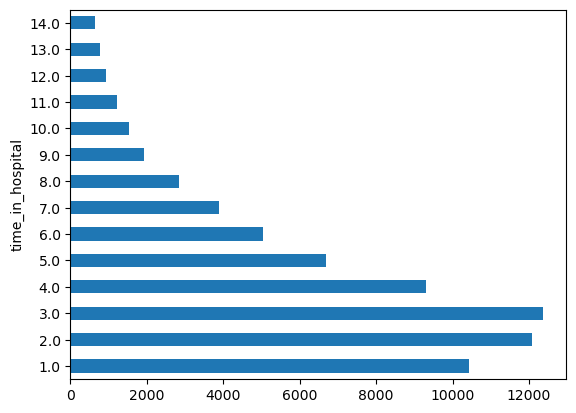

In [90]:
show_group_stats_viz(processed_df, target_field)

time_in_hospital
1.0     6279
2.0     7225
3.0     7407
4.0     5634
5.0     4007
6.0     2996
7.0     2332
8.0     1735
9.0     1165
10.0     896
11.0     734
12.0     574
13.0     425
14.0     385
dtype: int64
AxesSubplot(0.125,0.11;0.775x0.77)


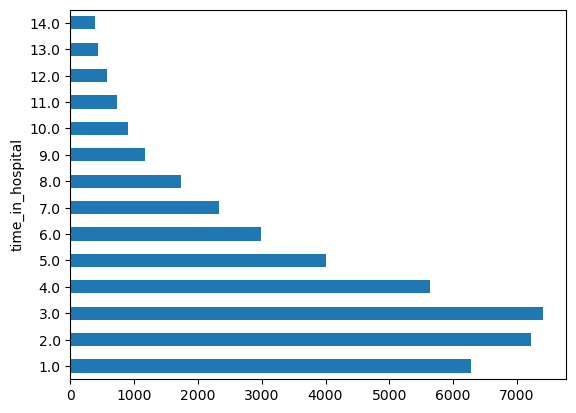

In [91]:
show_group_stats_viz(d_train, target_field)

time_in_hospital
1.0     2073
2.0     2415
3.0     2431
4.0     1846
5.0     1329
6.0     1055
7.0      763
8.0      569
9.0      389
10.0     317
11.0     252
12.0     194
13.0     161
14.0     138
dtype: int64
AxesSubplot(0.125,0.11;0.775x0.77)


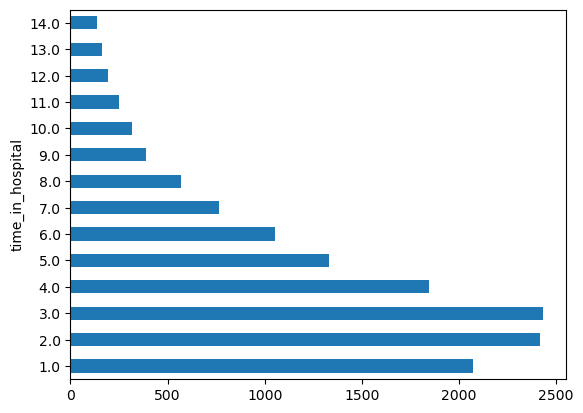

In [92]:
show_group_stats_viz(d_test, target_field)

## Demographic Group Analysis


We should check that our partitions/splits of the dataset are similar in terms of their demographic profiles. Below you can see how we might visualize and analyze the full dataset vs. the partitions.


gender
Female    37092
Male      32566
dtype: int64
AxesSubplot(0.125,0.11;0.775x0.77)


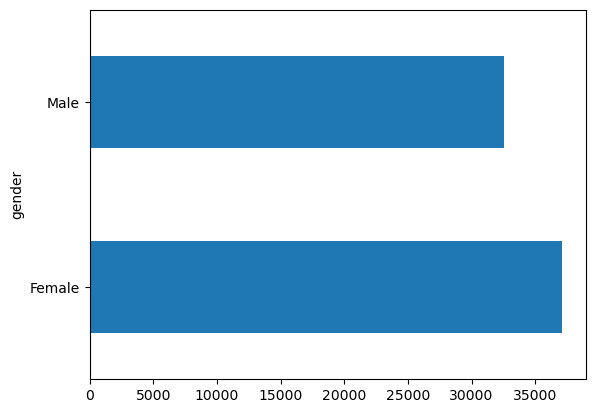

In [93]:
# Full dataset before splitting
patient_demo_features = ["race", "gender", "age", "patient_nbr"]
patient_group_analysis_df = (
    processed_df[patient_demo_features]
    .groupby("patient_nbr")
    .head(1)
    .reset_index(drop=True)
)
show_group_stats_viz(patient_group_analysis_df, "gender")

gender
Female    22239
Male      19555
dtype: int64
AxesSubplot(0.125,0.11;0.775x0.77)


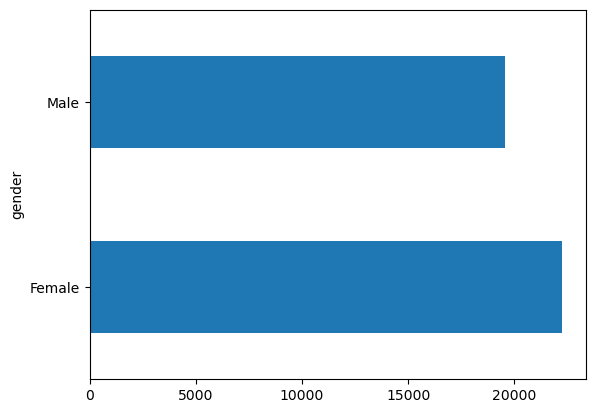

In [94]:
# Training partition
show_group_stats_viz(d_train, "gender")

gender
Female    7452
Male      6480
dtype: int64
AxesSubplot(0.125,0.11;0.775x0.77)


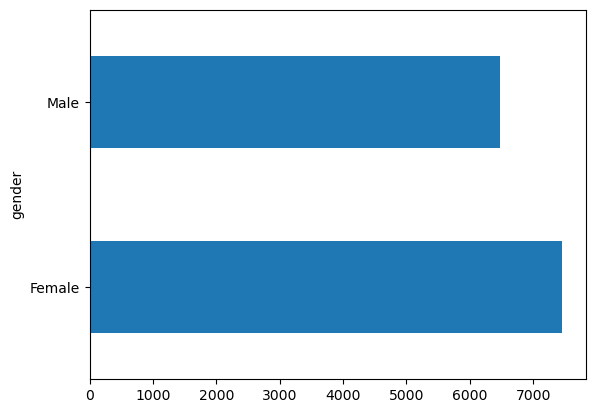

In [95]:
# Test partition
show_group_stats_viz(d_test, "gender")

## Convert Dataset Splits to TF Dataset


We have provided you the function to convert the Pandas dataframe to TF tensors using the TF Dataset API.
Please note that this is not a scalable method and for larger datasets, the 'make_csv_dataset' method is recommended -https://www.tensorflow.org/api_docs/python/tf/data/experimental/make_csv_dataset.


In [96]:
# Convert dataset from Pandas dataframes to TF dataset
batch_size = 4096
diabetes_train_ds = df_to_dataset(d_train, target_field, batch_size=batch_size)
diabetes_val_ds = df_to_dataset(d_val, target_field, batch_size=batch_size)
diabetes_test_ds = df_to_dataset(d_test, target_field, batch_size=batch_size)

In [97]:
# We use this sample of the dataset to show transformations later
diabetes_batch = next(iter(diabetes_train_ds))[0]


def demo(feature_column, example_batch):
    feature_layer = tf.keras.layers.DenseFeatures(feature_column)
    print(feature_layer(example_batch))

# 4. Create Categorical Features with TF Feature Columns


## Build Vocabulary for Categorical Features


Before we can create the TF categorical features, we must first create the vocab files with the unique values for a given field that are from the **training** dataset. Below we have provided a function that you can use that only requires providing the pandas train dataset partition and the list of the categorical columns in a list format. The output variable 'vocab_file_list' will be a list of the file paths that can be used in the next step for creating the categorical features.


In [98]:
vocab_dir = data_root.joinpath("vocabulary")
vocab_dir.mkdir(parents=True, exist_ok=True)

vocab_files = build_vocab_files(d_train, cat_fields, save_dir=vocab_dir)

## Create Categorical Features with Tensorflow Feature Column API


**Question 7**: Using the vocab file list from above that was derived fromt the features you selected earlier, please create categorical features with the Tensorflow Feature Column API, https://www.tensorflow.org/api_docs/python/tf/feature_column. Below is a function to help guide you.


In [99]:
tf_cat_col_list = create_tf_categorical_feature_cols(cat_fields, vocab_files)

INFO:tensorflow:vocabulary_size = 6 in race is inferred from the number of elements in the vocabulary_file ../data/vocabulary/race_vocab.txt.


INFO:tensorflow:vocabulary_size = 6 in race is inferred from the number of elements in the vocabulary_file ../data/vocabulary/race_vocab.txt.


INFO:tensorflow:vocabulary_size = 3 in gender is inferred from the number of elements in the vocabulary_file ../data/vocabulary/gender_vocab.txt.


INFO:tensorflow:vocabulary_size = 3 in gender is inferred from the number of elements in the vocabulary_file ../data/vocabulary/gender_vocab.txt.


INFO:tensorflow:vocabulary_size = 11 in age is inferred from the number of elements in the vocabulary_file ../data/vocabulary/age_vocab.txt.


INFO:tensorflow:vocabulary_size = 11 in age is inferred from the number of elements in the vocabulary_file ../data/vocabulary/age_vocab.txt.


INFO:tensorflow:vocabulary_size = 643 in primary_diagnosis_code is inferred from the number of elements in the vocabulary_file ../data/vocabulary/primary_diagnosis_code_vocab.txt.


INFO:tensorflow:vocabulary_size = 643 in primary_diagnosis_code is inferred from the number of elements in the vocabulary_file ../data/vocabulary/primary_diagnosis_code_vocab.txt.


INFO:tensorflow:vocabulary_size = 3 in change is inferred from the number of elements in the vocabulary_file ../data/vocabulary/change_vocab.txt.


INFO:tensorflow:vocabulary_size = 3 in change is inferred from the number of elements in the vocabulary_file ../data/vocabulary/change_vocab.txt.


INFO:tensorflow:vocabulary_size = 4 in readmitted is inferred from the number of elements in the vocabulary_file ../data/vocabulary/readmitted_vocab.txt.


INFO:tensorflow:vocabulary_size = 4 in readmitted is inferred from the number of elements in the vocabulary_file ../data/vocabulary/readmitted_vocab.txt.


In [100]:
test_cat_var1 = tf_cat_col_list[0]
print("Example categorical field:\n{}".format(test_cat_var1))
demo(test_cat_var1, diabetes_batch)

Example categorical field:
IndicatorColumn(categorical_column=VocabularyFileCategoricalColumn(key='race', vocabulary_file='../data/vocabulary/race_vocab.txt', vocabulary_size=6, num_oov_buckets=1, dtype=tf.string, default_value=-1, file_format=None))
tf.Tensor(
[[0. 1. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 ...
 [0. 1. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]], shape=(4096, 7), dtype=float32)


# 5. Create Numerical Features with TF Feature Columns


**Question 8**: Using the TF Feature Column API(https://www.tensorflow.org/api_docs/python/tf/feature_column/), create normalized Tensorflow numeric features for the model using z-score normalization.


In [101]:
tf_cont_col_list = create_tf_numerical_feature_cols(d_train, num_fields)

In [102]:
test_cont_var1 = tf_cont_col_list[0]
print("Example continuous field:\n{}\n".format(test_cont_var1))
demo(test_cont_var1, diabetes_batch)

Example continuous field:
NumericColumn(key='num_lab_procedures', shape=(1,), default_value=(0.0,), dtype=tf.float64, normalizer_fn=functools.partial(<function normalize_numeric_with_zscore at 0x7fc0d872ef80>, mean=43.046537780542664, std=19.988659050990215))

tf.Tensor(
[[-0.40255517]
 [ 0.297842  ]
 [ 0.14775689]
 ...
 [ 0.24781363]
 [ 1.0482675 ]
 [-2.1035197 ]], shape=(4096, 1), dtype=float32)


# 6. Build Deep Learning Regression Model with Sequential API and TF Probability Layers


## Use DenseFeatures to combine features for model


Now that we have prepared categorical and numerical features using Tensorflow's Feature Column API, we can combine them into a dense vector representation for the model. Below we will create this new input layer, which we will call 'claim_feature_layer'.


In [103]:
claim_feature_columns = tf_cat_col_list + tf_cont_col_list
claim_feature_layer = tf.keras.layers.DenseFeatures(claim_feature_columns)

## Build Sequential API Model from DenseFeatures and TF Probability Layers


Below we have provided some boilerplate code for building a model that connects the Sequential API, DenseFeatures, and Tensorflow Probability layers into a deep learning model. There are many opportunities to further optimize and explore different architectures through benchmarking and testing approaches in various research papers, loss and evaluation metrics, learning curves, hyperparameter tuning, TF probability layers, etc. Feel free to modify and explore as you wish.


In [104]:
diabetes_model, history = build_train_model(
    diabetes_train_ds, diabetes_val_ds, claim_feature_layer, epochs=1000
)

Epoch 1/1000


10/11 [==========================>...] - ETA: 0s - loss: 98.0194 - mse: 97.3648  WARNING:tensorflow:Layers in a Sequential model should only have a single input tensor. Received: inputs={'patient_nbr': <tf.Tensor 'IteratorGetNext:7' shape=(None,) dtype=int64>, 'race': <tf.Tensor 'IteratorGetNext:9' shape=(None,) dtype=string>, 'gender': <tf.Tensor 'IteratorGetNext:2' shape=(None,) dtype=string>, 'age': <tf.Tensor 'IteratorGetNext:0' shape=(None,) dtype=string>, 'primary_diagnosis_code': <tf.Tensor 'IteratorGetNext:8' shape=(None,) dtype=string>, 'change': <tf.Tensor 'IteratorGetNext:1' shape=(None,) dtype=string>, 'readmitted': <tf.Tensor 'IteratorGetNext:10' shape=(None,) dtype=string>, 'num_lab_procedures': <tf.Tensor 'IteratorGetNext:3' shape=(None,) dtype=int64>, 'number_diagnoses': <tf.Tensor 'IteratorGetNext:6' shape=(None,) dtype=int64>, 'num_medications': <tf.Tensor 'IteratorGetNext:4' shape=(None,) dtype=int64>, 'num_procedures': <tf.Tensor 'IteratorGetNext:5' shape=(None,) dt

11/11 [==============================] - 5s 136ms/step - loss: 97.8682 - mse: 97.2154 - val_loss: 26.0027 - val_mse: 25.4254
Epoch 2/1000
11/11 [==============================] - 1s 83ms/step - loss: 88.0892 - mse: 87.4355 - val_loss: 29.6022 - val_mse: 28.9840
Epoch 3/1000
11/11 [==============================] - 1s 97ms/step - loss: 91.2848 - mse: 90.6271 - val_loss: 30.1174 - val_mse: 29.3915
Epoch 4/1000
11/11 [==============================] - 1s 86ms/step - loss: 88.0051 - mse: 87.3923 - val_loss: 27.2172 - val_mse: 26.6241
Epoch 5/1000
11/11 [==============================] - 1s 78ms/step - loss: 84.3674 - mse: 83.7870 - val_loss: 27.8841 - val_mse: 27.1977
Epoch 6/1000
11/11 [==============================] - 1s 75ms/step - loss: 81.8633 - mse: 81.1409 - val_loss: 39.1079 - val_mse: 38.4534
Epoch 7/1000
11/11 [==============================] - 1s 90ms/step - loss: 85.1212 - mse: 84.5028 - val_loss: 35.0423 - val_mse: 34.6892
Epoch 8/1000
11/11 [==============================] -

<AxesSubplot: >

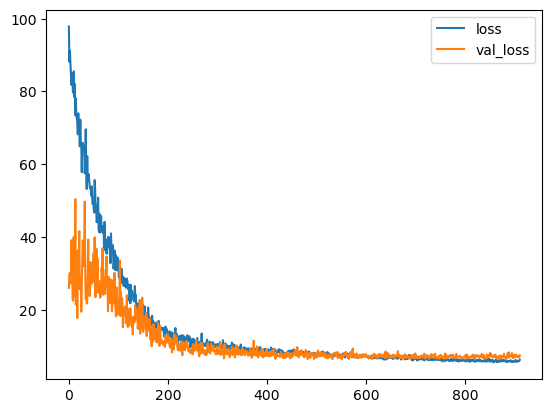

In [105]:
pd.DataFrame(history.history)[["loss", "val_loss"]].plot()

## Show Model Uncertainty Range with TF Probability


**Question 9**: Now that we have trained a model with TF Probability layers, we can extract the mean and standard deviation for each prediction. Please fill in the answer for the m and s variables below. The code for getting the predictions is provided for you below.


In [106]:
diabetes_x_tst = dict(d_test[cat_fields + num_fields])
diabetes_yhat = diabetes_model(diabetes_x_tst)

preds = diabetes_model.predict(diabetes_test_ds)
preds_mean, preads_std = (
    diabetes_yhat.mean(),
    diabetes_yhat.stddev(),
)

9              Caucasian
12             Caucasian
22             Caucasian
26       AfricanAmerican
              ...       
69629          Caucasian
69644          Caucasian
69645          Caucasian
69653          Caucasian
69657          Caucasian
Name: race, Length: 13932, dtype: object, 'gender': 7        Female
9        Female
12         Male
22         Male
26       Female
          ...  
69629      Male
69644    Female
69645      Male
69653    Female
69657      Male
Name: gender, Length: 13932, dtype: object, 'age': 7        [40-50)
9        [70-80)
12       [60-70)
22       [60-70)
26       [70-80)
          ...   
69629    [80-90)
69644    [80-90)
69645    [80-90)
69653    [80-90)
69657    [40-50)
Name: age, Length: 13932, dtype: object, 'primary_diagnosis_code': 7        996
9        682
12       276
22       486
26       599
        ... 
69629    428
69644    428
69645    958
69653    285
69657    553
Name: primary_diagnosis_code, Length: 13932, dtype: object, 'change': 7   

9              Caucasian
12             Caucasian
22             Caucasian
26       AfricanAmerican
              ...       
69629          Caucasian
69644          Caucasian
69645          Caucasian
69653          Caucasian
69657          Caucasian
Name: race, Length: 13932, dtype: object, 'gender': 7        Female
9        Female
12         Male
22         Male
26       Female
          ...  
69629      Male
69644    Female
69645      Male
69653    Female
69657      Male
Name: gender, Length: 13932, dtype: object, 'age': 7        [40-50)
9        [70-80)
12       [60-70)
22       [60-70)
26       [70-80)
          ...   
69629    [80-90)
69644    [80-90)
69645    [80-90)
69653    [80-90)
69657    [40-50)
Name: age, Length: 13932, dtype: object, 'primary_diagnosis_code': 7        996
9        682
12       276
22       486
26       599
        ... 
69629    428
69644    428
69645    958
69653    285
69657    553
Name: primary_diagnosis_code, Length: 13932, dtype: object, 'change': 7   

4/4 [==============================] - 1s 23ms/step


## Show Prediction Output


In [107]:
prob_outputs = {
    "pred": preds.flatten(),
    "actual_value": d_test["time_in_hospital"].values,
    "pred_mean": preds_mean.numpy().flatten(),
    "pred_std": preads_std.numpy().flatten(),
}
prob_output_df = pd.DataFrame(prob_outputs)

In [108]:
prob_output_df.head()

,pred,actual_value,pred_mean,pred_std
0,3.968199,2.0,5.172105,0.697681
1,2.936731,12.0,7.165725,0.697881
2,2.636845,2.0,4.052765,0.697624
3,3.965094,1.0,4.704368,0.697619
4,5.229675,4.0,5.166575,0.697647


## Convert Regression Output to Classification Output for Patient Selection


**Question 10**: Given the output predictions, convert it to a binary label for whether the patient meets the time criteria or does not. The expected output is a numpy array with a 1 or 0 based off if the prediction meets or doesnt meet the criteria.


In [109]:
prob_output_df = get_student_binary_prediction(prob_output_df, "pred_mean")
prob_output_df.head()

,pred,actual_value,pred_mean,pred_std,pred_binary
0,3.968199,2.0,5.172105,0.697681,1
1,2.936731,12.0,7.165725,0.697881,1
2,2.636845,2.0,4.052765,0.697624,0
3,3.965094,1.0,4.704368,0.697619,0
4,5.229675,4.0,5.166575,0.697647,1


### Add Binary Prediction to Test Dataframe


Using the student_binary_prediction output that is a numpy array with binary labels, we can use this to add to a dataframe to better visualize and also to prepare the data for the Aequitas toolkit. The Aequitas toolkit requires that the predictions be mapped to a binary label for the predictions (called 'score' field) and the actual value (called 'label_value').


In [110]:
def add_pred_to_test(test_df, pred_np, demo_col_list):
    for c in demo_col_list:
        test_df[c] = test_df[c].astype(str)
    test_df["score"] = pred_np
    test_df["label_value"] = test_df["time_in_hospital"].apply(lambda x: int(x >= 5))
    return test_df


pred_test_df = add_pred_to_test(
    d_test, prob_output_df["pred_binary"].values, ["race", "gender"]
)

In [111]:
pred_test_df[
    ["patient_nbr", "gender", "race", "time_in_hospital", "score", "label_value"]
].head()

,patient_nbr,gender,race,time_in_hospital,score,label_value
7,1314,Female,Caucasian,2.0,1,0
9,2025,Female,Caucasian,12.0,1,1
12,5220,Male,Caucasian,2.0,0,0
22,8208,Male,Caucasian,1.0,0,0
26,10422,Female,AfricanAmerican,4.0,1,0


## Model Evaluation Metrics


**Question 11**: Now it is time to use the newly created binary labels in the 'pred_test_df' dataframe to evaluate the model with some common classification metrics. Please create a report summary of the performance of the model and be sure to give the ROC AUC, F1 score(weighted), class precision and recall scores.


In [112]:
class_report = classification_report(pred_test_df["label_value"], pred_test_df["score"])
print(class_report)

              precision    recall  f1-score   support

           0       0.84      0.70      0.76      8765
           1       0.60      0.78      0.68      5167

    accuracy                           0.73     13932
   macro avg       0.72      0.74      0.72     13932
weighted avg       0.75      0.73      0.73     13932



Above is the classification report. Overall, we have achieved a weighted average precision, recall and F1 score of ~0.75, ~0.73 and ~0.73, respectively.

The patient regression model has been optimized to minimize the error in the predicted hospital stay of each patient. Therefore, here the error is a continuous value.

However, once we convert the continous predictions to binary labels by assessing whether each patient is eligible for the drug trial, we essentially convert our regression predictions to binary labels. Then, we can use **Precision**, *the fraction of relevant instances among the retrieved instances*, and **recall**, *the fraction of relevant instances that were retrieved* as our final performance metrics.

Precision and recall are often opposing metrics, also known as the precision-recall tradeoff. This means that achieving a high precision normally comes at the cost of a low recall and viceversa. Machine learnign models can be optimized to prioritize one or both of these metrics.

The model used in this project is a fairly simple one, composed of just a few fully-connected layers and including regularization techniques such as weight normalization, as well as batch normalization and dropout layers. Naturally, the choices for improvement are endless, from using a completely different architecture to tuning each hyper-parameter such as activation functions, optimizers and so on.

It is also worth mentioning that other families of algorithms such as random forests and boosting ensemble algorithms (e.g. XGBoost, LightGBM, etc.) could have also been used. In fact, these are known for achieving state of the art results on tabular data.

# 7. Evaluating Potential Model Biases with Aequitas Toolkit


## Prepare Data For Aequitas Bias Toolkit


Using the gender and race fields, we will prepare the data for the Aequitas Toolkit.


In [113]:
ae_subset_df = pred_test_df[["race", "gender", "score", "label_value"]]
ae_df, _ = preprocess_input_df(ae_subset_df)
g = Group()
xtab, _ = g.get_crosstabs(ae_df)
absolute_metrics = g.list_absolute_metrics(xtab)
clean_xtab = xtab.fillna(-1)
aqp = Plot()
b = Bias()

/home/uziel/miniconda3/envs/diabetes_drug_testing/lib/python3.10/site-packages/aequitas/group.py:182: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, 'score'] = df.loc[:,'score'].astype(float)


## Race and Gender Bias Analysis for Patient Selection


**Question 12**: For the gender and race fields, please plot two metrics that are important for patient selection below and state whether there is a significant bias in your model across any of the groups along with justification for your statement.


In [114]:
absolute_metrics = g.list_absolute_metrics(xtab)
xtab[[col for col in xtab.columns if col not in absolute_metrics]]

,model_id,score_threshold,k,attribute_name,attribute_value,pp,pn,fp,fn,tn,tp,group_label_pos,group_label_neg,group_size,total_entities
0,0,binary 0/1,6660,race,AfricanAmerican,1305,1312,558,228,1084,747,975,1642,2617,13932
1,0,binary 0/1,6660,race,Asian,34,74,14,12,62,20,32,76,108,13932
2,0,binary 0/1,6660,race,Caucasian,5112,5569,1997,878,4691,3115,3993,6688,10681,13932
3,0,binary 0/1,6660,race,Hispanic,114,191,44,27,164,70,97,208,305,13932
4,0,binary 0/1,6660,race,Other,95,126,33,8,118,62,70,151,221,13932
5,0,binary 0/1,6660,gender,Female,3702,3750,1479,618,3132,2223,2841,4611,7452,13932
6,0,binary 0/1,6660,gender,Male,2958,3522,1167,535,2987,1791,2326,4154,6480,13932


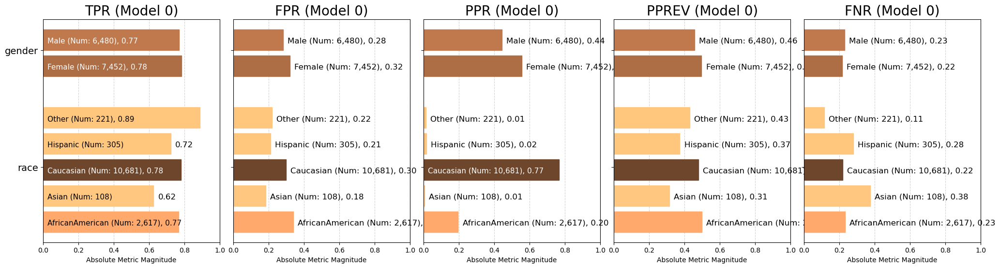

<Figure size 640x480 with 0 Axes>

In [115]:
p = aqp.plot_group_metric_all(
    xtab, metrics=["tpr", "fpr", "ppr", "pprev", "fnr"], ncols=5
)

There is no significant gender bias in the model. However, we can clearly see some racial bias in the PPR metric, which is considerably higher for caucassians compared to other races. A brief look at this metric seems to indicate a positive correlation with the number of samples. Since caucassian is by far the majority of participants, its PPR is the highest.

## Reference Group Selection


Below we have chosen the reference group for our analysis but feel free to select another one.


In [116]:
# test reference group with Caucasian Male
bdf = b.get_disparity_predefined_groups(
    clean_xtab,
    original_df=ae_df,
    ref_groups_dict={"race": "Caucasian", "gender": "Male"},
    alpha=0.05,
    check_significance=False,
)


f = Fairness()
fdf = f.get_group_value_fairness(bdf)

get_disparity_predefined_group()


## Fairness Analysis Example - Relative to a Reference Group


**Question 13**: Earlier we defined our reference group and then calculated disparity metrics relative to this grouping. Please provide a visualization of the fairness evaluation for this reference group and analyze whether there is disparity.


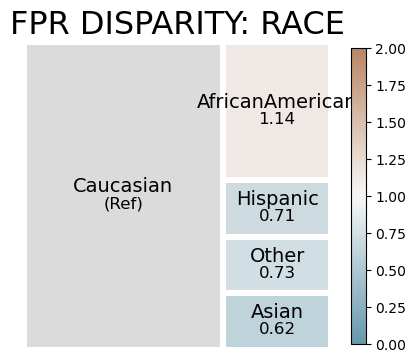

In [117]:
fpr_disparity = aqp.plot_disparity(
    bdf, group_metric="fpr_disparity", attribute_name="race"
)

When examining the FPR metric African Americans are over 0.14x more likely to be falsely identified, whereas the other races are less likely to be incorrectly identified compared to Caucasian patients.

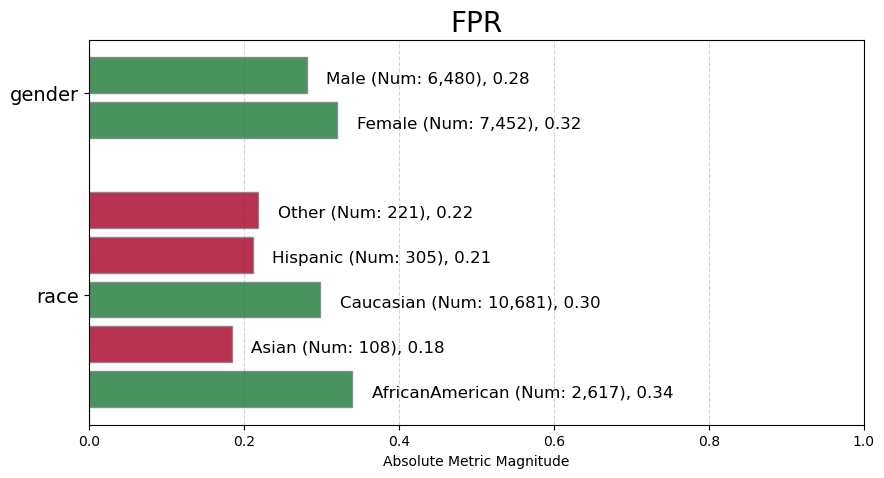

In [118]:
fpr_fairness = aqp.plot_fairness_group(fdf, group_metric="fpr", title=True)

When examining the FPR metric, model is fair for males and females, but not so for hispanic, asian and "other" patients.